In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cvxpy as cp
import gurobipy as gp
from gurobipy import GRB
import matplotlib.patches as patches
import time
import random
from collections import deque

## Import Data and Calculate Variability Bounds

In [2]:
### import network
BB = np.load('SCE56_network.npy')
YY = np.load('SCE56_network_admitance.npy')
num_node = BB.shape[0]

In [3]:
### import data
p_arr = np.load('HICSS_data_load_p.npy')
q_arr = np.load('HICSS_data_load_q.npy')

p_pv_arr = np.load('HICSS_data_pv_p.npy')
q_pv_arr = np.load('HICSS_data_pv_q.npy')

horizon = p_pv_arr.shape[1]

In [4]:
### Calculate the power variability bounds
scale_factor = 1

load_var_upp = 0.6  * scale_factor
load_var_low = 0.6 * scale_factor
pvp_var_upp = 1 * scale_factor
pvq_var_upp = 1 * scale_factor
pvq_var_low = 1.5 * scale_factor

p_load_upp = np.empty(num_node)
p_load_low = np.empty(num_node)
q_load_upp = np.empty(num_node)
q_load_low = np.empty(num_node)

for i in range(num_node):
    p_load_upp[i] = p_arr[i, 0] * (1 + load_var_upp)
    p_load_low[i] = p_arr[i, 0] * (1 - load_var_low)
    if q_arr[i, 0] > 0:
        q_load_upp[i] = q_arr[i, 0] * (1 + load_var_upp)
        q_load_low[i] = q_arr[i, 0] * (1 - load_var_low)
    else: 
        q_load_upp[i] = q_arr[i, 0]
        q_load_low[i] = q_arr[i, 0]

p_pv_upp = np.empty(num_node)
p_pv_low = np.empty(num_node)
q_pv_upp = np.empty(num_node)
q_pv_low = np.empty(num_node)


for i in range(num_node):
    p_pv_upp[i] = p_pv_arr[i, 0] * (1 + pvp_var_upp)
    p_pv_low[i] = p_pv_arr[i, 0] * 0
    q_pv_upp[i] = q_pv_arr[i, 0] * (1 + pvq_var_upp)
    q_pv_low[i] = q_pv_arr[i, 0] * (1 - pvq_var_low)

In [5]:
x1 = np.hstack([(p_pv_low - p_load_upp), (q_pv_low - q_load_upp)])    # lower bound
x2 = np.hstack([(p_pv_upp - p_load_low), (q_pv_upp - q_load_low)])    # upper bound

In [6]:
### Full voltage data for LinDistFlow
vv_list = []

for t in range(horizon):
    vv = []
    for j in range(num_node):
        vvj = BB[j, :] @ np.hstack([p_pv_arr[:, t] - p_arr[:, t], q_pv_arr[:, t] - q_arr[:, t]])
        vv.append(vvj)
    vv_list.append(np.array(vv))

print(len(vv_list))

5760


# Main Framework

In [7]:
### Length of each dataset: daily voltage profile with 5 min interval T = 12 * 24 = 288
horizon_day = 288

In [8]:
### Choose the proper value for Big-M 
print(np.min(BB @ x1))
print(np.max(BB @ x2))

# M = 0.15

-0.13468990378471693
0.14805623004726376


### Functions for Performance Evaluation

In [9]:
### Calculate the voltage violation metric of given selected measurement $H(s)$
def vol_violation_full(mea_selected, set_index):
    info_list0 = []
    info_list1 = []
    nodescenario_list0 = []
    nodescenario_list1 = []

    ### define the problem outside the iteration to reduce the cvxpy overhead
    xx = cp.Variable(2 * num_node)

    c_par = cp.Parameter(2 * num_node)
    vm_par = cp.Parameter(len(mea_selected))

    obj1 = cp.Minimize(c_par @ xx)
    obj2 = cp.Maximize(c_par @ xx)

    constraint = [x1 <= xx]
    constraint += [xx <= x2]
    # slightly relax it
    for i in range(len(mea_selected)):
        constraint += [BB[mea_selected[i], :] @ xx == vm_par[i]]

    prob1 = cp.Problem(obj1, constraint)
    prob2 = cp.Problem(obj2, constraint)


    for node in list(range(num_node)):
        for scenario in list(range(set_index * horizon_day, (set_index + 1)*horizon_day)):
            c_par.value = np.array(BB[node, :])
            vm_list = []
            for i in range(len(mea_selected)):
                vm_list.append(np.array(vv_list)[scenario][mea_selected[i]])

            vm_par.value = np.array(vm_list)

            prob1.solve(solver=cp.GUROBI,
            warm_start=True,
            verbose=False)

            prob2.solve(solver=cp.GUROBI,
            warm_start=True,
            verbose=False)
        
            vol_ach_min = np.array(prob1.value)
            vol_ach_max = np.array(prob2.value)

            info0 = max((-0.05 - vol_ach_min), 0) 
            info1 = max((vol_ach_max - 0.05), 0)

            print("Nodescenario pair ({}, {})".format(node, scenario)) 
            print(info0) 
            print(info1) 
            if info0 > 0.:
                info_list0.append(info0)
                nodescenario_list0.append([node, scenario])
            if info1 > 0.0:
                info_list1.append(info1)
                nodescenario_list1.append([node, scenario])
    
    return info_list0, info_list1, nodescenario_list0, nodescenario_list1

## Optimality and Scalability of Scenario-reduction Method

### Fixed Threshold with Different Safety Margin over One Dataset 

In [10]:
def fixed_threshold_construct(set_index, margin):
    """
    Given the set_index and safety margin, it constrcuts the scenario-reduction sets
    """
    ### Upper limit
    vol_violation_nodescenario_upp = {}
    for i in range(set_index * horizon_day, (set_index + 1)*horizon_day):
        for j in range(num_node):
            if vv_list[i][j] >= 0.05 - margin:
                vol_violation_nodescenario_upp[(j, i)] = vv_list[i][j]
    
    nodescenario_pair_upp = list(vol_violation_nodescenario_upp.keys()) # this is to only take (i, t)
    nodescenario_pair_upp = [list(x) for x in nodescenario_pair_upp]

    ### Lower limit
    vol_violation_nodescenario_low = {}
    for i in range(set_index  * horizon_day, (set_index + 1) * horizon_day):
        for j in range(num_node):
            if vv_list[i][j] <= -0.05 + margin: 
                vol_violation_nodescenario_low[(j, i)] = vv_list[i][j]

    nodescenario_pair_low = list(vol_violation_nodescenario_low.keys())
    nodescenario_pair_low = [list(x) for x in nodescenario_pair_low]

                
    return nodescenario_pair_upp, nodescenario_pair_low

In [11]:
def fixed_threshold_solve(A, 
                          x_min, 
                          x_max, 
                          nodescenario_pair_upp, 
                          nodescenario_pair_low, 
                          rho, 
                          C_matrix,
                          v_min,
                          v_max,
                          M_val,
                          mip_gap,
                          time_limit=1000):

    # ------------------------------------------------------------
    # 1. Dimensions and data
    # ------------------------------------------------------------
    n = num_node

    R_low = nodescenario_pair_low
    R_upp = nodescenario_pair_upp

    num_R_low = len(R_low)
    num_R_upp = len(R_upp)

    # ------------------------------------------------------------
    # 2. Initialize model
    # ------------------------------------------------------------
    m = gp.Model("Scenario_reduction_fixed_threshold")

    ### Make computation time consistent
    m.setParam('Threads', 8)
    m.setParam('Seed', 40)

    # ------------------------------------------------------------
    # 3. measurement placement variables
    # ------------------------------------------------------------
    s = m.addVars(n, vtype=GRB.BINARY, name="s")


    # ------------------------------------------------------------
    # 4. Slack variables
    # ------------------------------------------------------------
    # Lower-limit violation slack:
    #     f_i^low(s,t) >= v_min - ell_low[q]
    ell_low = m.addVars(num_R_low, lb=0.0, name="ell_low")

    # Upper-limit violation slack:
    #     f_i^upp(s,t) <= v_max + ell_upp[q]
    ell_upp = m.addVars(num_R_upp, lb=0.0, name="ell_upp")

    # ------------------------------------------------------------
    # 5. Dual variables for LOWER-limit selected  pairs
    # ------------------------------------------------------------
    # Lower-limit primal:
    #
    #     min_x c_i^T x
    #     s.t. x_min <= x <= x_max
    #          v_under(s,t) <= A x <= v_bar(s,t)
    #
    # Dual expression:
    #
    #     alpha_l^T x_min - alpha_u^T x_max
    #     + beta_l^T v_under - beta_u^T v_bar
    #
    alpha_l_low = m.addVars(num_R_low, 2*n, lb=0.0, name="alpha_l_low")
    alpha_u_low = m.addVars(num_R_low, 2*n, lb=0.0, name="alpha_u_low")
    beta_l_low  = m.addVars(num_R_low, n,   lb=0.0, name="beta_l_low")
    beta_u_low  = m.addVars(num_R_low, n,   lb=0.0, name="beta_u_low")

    # ------------------------------------------------------------
    # 6. Dual variables for UPPER-limit selected pairs
    # ------------------------------------------------------------
    # Upper-limit primal:
    #
    #     max_x c_i^T x
    #     s.t. x_min <= x <= x_max
    #          v_under(s,t) <= A x <= v_bar(s,t)
    #
    # Dual expression:
    #
    #     alpha_u^T x_max - alpha_l^T x_min
    #     + beta_u^T v_bar - beta_l^T v_under
    #
    alpha_l_upp = m.addVars(num_R_upp, 2*n, lb=0.0, name="alpha_l_upp")
    alpha_u_upp = m.addVars(num_R_upp, 2*n, lb=0.0, name="alpha_u_upp")
    beta_l_upp  = m.addVars(num_R_upp, n,   lb=0.0, name="beta_l_upp")
    beta_u_upp  = m.addVars(num_R_upp, n,   lb=0.0, name="beta_u_upp")

    # ------------------------------------------------------------
    # 7. Objective
    # ------------------------------------------------------------
    # Minimize total violation metric for lower-limit and upper-limit
    m.setObjective(
        gp.quicksum(ell_low[q] for q in range(num_R_low))
        + gp.quicksum(ell_upp[q] for q in range(num_R_upp)),
        GRB.MINIMIZE
    )

    # ------------------------------------------------------------
    # 8. measurement budget
    # ------------------------------------------------------------
    m.addConstr(
        gp.quicksum(s[j] for j in range(n)) == rho,
        name="budget"
    )

    # ------------------------------------------------------------
    # 9. LOWER-limit strong-duality constraints
    # ------------------------------------------------------------
    for q, (i, t) in enumerate(R_low):

        ci = C_matrix[i, :]
        v_const = vv_list[t]

        lower_expr = gp.LinExpr()

        # --------------------------------------------------------
        # Dual objective for lower-limit min problem:
        #
        #     alpha_l^T x_min - alpha_u^T x_max
        #     + beta_l^T v_under - beta_u^T v_bar
        #
        # where
        #
        #     v_under[k] = v_const[k] * s[k] - M_val * (1 - s[k])
        #                = -M_val + (v_const[k] + M_val) * s[k]
        #
        #     v_bar[k]   = v_const[k] * s[k] + M_val * (1 - s[k])
        #                =  M_val + (v_const[k] - M_val) * s[k]
        # --------------------------------------------------------

        # alpha terms
        lower_expr += gp.quicksum(
            alpha_l_low[q, j] * x_min[j]
            for j in range(2*n)
        )

        lower_expr -= gp.quicksum(
            alpha_u_low[q, j] * x_max[j]
            for j in range(2*n)
        )

        # expanded beta terms
        for k in range(n):

            # beta_l * v_under
            lower_expr += -M_val * beta_l_low[q, k]
            lower_expr += (v_const[k] + M_val) * beta_l_low[q, k] * s[k]

            # - beta_u * v_bar
            lower_expr += -M_val * beta_u_low[q, k]
            lower_expr += -(v_const[k] - M_val) * beta_u_low[q, k] * s[k]

        # Lower-limit violation constraint:
        #
        #     f_i^low(s,t) >= v_min - ell_low[q]
        #
        # Since lower_expr equals the lower-limit primal optimum
        # through strong duality, enforce:
        #
        #     lower_expr >= v_min - ell_low[q]
        m.addConstr(
            lower_expr >= v_min - ell_low[q],
            name=f"lower_main_q{q}_i{i}_t{t}"
        )

        # --------------------------------------------------------
        # Dual feasibility / stationarity for lower-limit min problem
        #
        #     c_i - alpha_l + alpha_u - A^T beta_l + A^T beta_u = 0
        # --------------------------------------------------------
        for j in range(2*n):
            m.addConstr(
                ci[j]
                - alpha_l_low[q, j]
                + alpha_u_low[q, j]
                - gp.quicksum(A[k, j] * beta_l_low[q, k] for k in range(n))
                + gp.quicksum(A[k, j] * beta_u_low[q, k] for k in range(n))
                == 0,
                name=f"lower_dual_balance_q{q}_j{j}"
            )

    # ------------------------------------------------------------
    # 10. UPPER-limit strong-duality constraints
    # ------------------------------------------------------------
    for q, (i, t) in enumerate(R_upp):

        ci = C_matrix[i, :]
        v_const = vv_list[t]

        upper_expr = gp.LinExpr()

        # --------------------------------------------------------
        # Dual objective for upper-limit max problem:
        #
        #     alpha_u^T x_max - alpha_l^T x_min
        #     + beta_u^T v_bar - beta_l^T v_under
        #
        # where
        #
        #     v_under[k] = -M_val + (v_const[k] + M_val) * s[k]
        #     v_bar[k]   =  M_val + (v_const[k] - M_val) * s[k]
        # --------------------------------------------------------

        # alpha terms
        upper_expr += gp.quicksum(
            alpha_u_upp[q, j] * x_max[j]
            for j in range(2*n)
        )

        upper_expr -= gp.quicksum(
            alpha_l_upp[q, j] * x_min[j]
            for j in range(2*n)
        )

        # expanded beta terms
        for k in range(n):

            # beta_u * v_bar
            upper_expr += M_val * beta_u_upp[q, k]
            upper_expr += (v_const[k] - M_val) * beta_u_upp[q, k] * s[k]

            # - beta_l * v_under
            upper_expr += M_val * beta_l_upp[q, k]
            upper_expr += -(v_const[k] + M_val) * beta_l_upp[q, k] * s[k]

        # Upper-limit violation constraint:
        #
        #     f_i^upp(s,t) <= v_max + ell_upp[q]
        #
        # Since upper_expr equals the upper-limit primal optimum
        # through strong duality, enforce:
        #
        #     upper_expr <= v_max + ell_upp[q]
        m.addConstr(
            upper_expr <= v_max + ell_upp[q],
            name=f"upper_main_q{q}_i{i}_t{t}"
        )

        # --------------------------------------------------------
        # Dual feasibility / stationarity for upper-limit max problem
        #
        #     c_i - alpha_u + alpha_l - A^T beta_u + A^T beta_l = 0
        # --------------------------------------------------------
        for j in range(2*n):
            m.addConstr(
                ci[j]
                - alpha_u_upp[q, j]
                + alpha_l_upp[q, j]
                - gp.quicksum(A[k, j] * beta_u_upp[q, k] for k in range(n))
                + gp.quicksum(A[k, j] * beta_l_upp[q, k] for k in range(n))
                == 0,
                name=f"upper_dual_balance_q{q}_j{j}"
            )

    # ------------------------------------------------------------
    # 11. Gurobi parameters
    # ------------------------------------------------------------
    m.setParam("NonConvex", 2)

    m.setParam("MIPFocus", 2)
    m.setParam("Presolve", 2)
    m.setParam("Cuts", 2)
    m.setParam("MIPGap", mip_gap)
    m.setParam("TimeLimit", time_limit)

    # ------------------------------------------------------------
    # 12. Optimize
    # ------------------------------------------------------------
    m.optimize()

    # ------------------------------------------------------------
    # 13. Extract solution
    # ------------------------------------------------------------
    print("\n--- Optimization status")
    print(m.Status)

    if m.Status in [GRB.OPTIMAL, GRB.TIME_LIMIT, GRB.SUBOPTIMAL]:

        print("\n--- Selected measurements")
        selected_measurements = [i for i in range(n) if s[i].X > 0.5]
        print(selected_measurements)

        print("\n--- Objective value")
        print(m.ObjVal)

    else:
        print("\nModel did not return a usable solution.")
    

    H_R = m.ObjVal
    return H_R, m.Runtime, selected_measurements

In [ ]:
margin_list = [0, 0.005, 0.01, 0.015] ### Try different thresholds
index = 2

H_R_list = []
Scenario_set_size_list = []
Time_list = []
Mea_selected_list = []

for margin in margin_list:  
    print('*'*20)
    print("Current safety margin is {}".format(margin))
    nodescenario_pair_upp, nodescenario_pair_low = fixed_threshold_construct(set_index=index, margin=margin)

    Scenario_set_size_list.append(len(nodescenario_pair_upp) + len(nodescenario_pair_low))

    H_R, Time_fix, Mea_selected = fixed_threshold_solve(A = BB, x_min= x1, x_max=x2, nodescenario_pair_upp=nodescenario_pair_upp, nodescenario_pair_low=nodescenario_pair_low,
                            rho=8, C_matrix= BB, v_min=-0.05, v_max=0.05, M_val=0.15, mip_gap=1e-4, time_limit=1e3)

    H_R_list.append(H_R)

    Time_list.append(Time_fix)

    Mea_selected_list.append(Mea_selected)

********************
Current safety margin is 0
Set parameter Threads to value 8
Set parameter Seed to value 40
Set parameter NonConvex to value 2
Set parameter MIPFocus to value 2
Set parameter Presolve to value 2
Set parameter Cuts to value 2
Set parameter MIPGap to value 0.0001
Set parameter TimeLimit to value 1000
Gurobi Optimizer version 13.0.2 build v13.0.2rc1 (mac64[arm] - Darwin 25.3.0 25D2128)

CPU model: Apple M1
Thread count: 8 physical cores, 8 logical processors, using up to 8 threads

Non-default parameters:
TimeLimit  1000
MIPFocus  2
Cuts  2
NonConvex  2
Presolve  2
Seed  40
Threads  8

Optimize a model with 331 rows, 1048 columns and 37015 nonzeros (Min)
Model fingerprint: 0xdf34e7a8
Model has 3 linear objective coefficients
Model has 3 quadratic constraints
Variable types: 993 continuous, 55 integer (55 binary)
Coefficient statistics:
  Matrix range     [1e-03, 1e+00]
  QMatrix range    [9e-02, 2e-01]
  QLMatrix range   [6e-03, 2e+00]
  Objective range  [1e+00, 1e+00]

In [16]:
### Results of Table 1
######################
print(H_R_list)
print(Scenario_set_size_list)
print(Time_list)

### Optimality check
info_list0, info_list1, _, _ = vol_violation_full(Mea_selected_list[-1], set_index=index)

print("Full voltage violation metric under $s_R$ is {}".format(np.sum(info_list0) + np.sum(info_list1)))

[0.011351333594669208, 0.01135133359466919, 0.011351333594669208, 0.011351333594669208]
[3, 16, 71, 208]
[0.37181901931762695, 4.442241191864014, 8.446154117584229, 25.83382797241211]
Nodescenario pair (0, 576)
0
0
Nodescenario pair (0, 577)
0
0
Nodescenario pair (0, 578)
0
0
Nodescenario pair (0, 579)
0
0
Nodescenario pair (0, 580)
0
0
Nodescenario pair (0, 581)
0
0
Nodescenario pair (0, 582)
0
0
Nodescenario pair (0, 583)
0
0
Nodescenario pair (0, 584)
0
0
Nodescenario pair (0, 585)
0
0
Nodescenario pair (0, 586)
0
0
Nodescenario pair (0, 587)
0
0
Nodescenario pair (0, 588)
0
0
Nodescenario pair (0, 589)
0
0
Nodescenario pair (0, 590)
0
0
Nodescenario pair (0, 591)
0
0
Nodescenario pair (0, 592)
0
0
Nodescenario pair (0, 593)
0
0
Nodescenario pair (0, 594)
0
0
Nodescenario pair (0, 595)
0
0
Nodescenario pair (0, 596)
0
0
Nodescenario pair (0, 597)
0
0
Nodescenario pair (0, 598)
0
0
Nodescenario pair (0, 599)
0
0
Nodescenario pair (0, 600)
0
0
Nodescenario pair (0, 601)
0
0
Nodescenar

### Fixed Threshold with Safety Margin $\sigma$ over Ten Datasets

In [19]:
### Arbitrarily select 10 datasets to evaluate the performance
dataset_num = 10

random.seed(2)
index_list = random.sample(range(20), dataset_num)

index_list = sorted(index_list)
print(index_list)

[1, 2, 4, 5, 10, 11, 12, 14, 16, 18]


In [21]:
margin = 0.015

H_R_list = []
Scenario_set_size_list = []
Time_list = []
Mea_selected_list = []

for index in index_list:
    print('*'*20)
    print("Current index of dataset is {}".format(index))
    nodescenario_pair_upp, nodescenario_pair_low = fixed_threshold_construct(set_index=index, margin=margin)

    Scenario_set_size_list.append(len(nodescenario_pair_upp) + len(nodescenario_pair_low))

    H_R, Time_fix, Mea_selected = fixed_threshold_solve(A = BB, x_min= x1, x_max=x2, nodescenario_pair_upp=nodescenario_pair_upp, 
    nodescenario_pair_low=nodescenario_pair_low, rho=8, C_matrix= BB, v_min=-0.05, v_max=0.05, M_val=0.15, mip_gap=1e-4, time_limit=1e3)

    H_R_list.append(H_R)

    Time_list.append(Time_fix)

    Mea_selected_list.append(Mea_selected)

********************
Current index of dataset is 1
Set parameter Threads to value 8
Set parameter Seed to value 40
Set parameter NonConvex to value 2
Set parameter MIPFocus to value 2
Set parameter Presolve to value 2
Set parameter Cuts to value 2
Set parameter MIPGap to value 0.0001
Set parameter TimeLimit to value 1000
Gurobi Optimizer version 13.0.2 build v13.0.2rc1 (mac64[arm] - Darwin 25.3.0 25D2128)

CPU model: Apple M1
Thread count: 8 physical cores, 8 logical processors, using up to 8 threads

Non-default parameters:
TimeLimit  1000
MIPFocus  2
Cuts  2
NonConvex  2
Presolve  2
Seed  40
Threads  8

Optimize a model with 17491 rows, 52684 columns and 1958935 nonzeros (Min)
Model fingerprint: 0xed965942
Model has 159 linear objective coefficients
Model has 159 quadratic constraints
Variable types: 52629 continuous, 55 integer (55 binary)
Coefficient statistics:
  Matrix range     [1e-03, 1e+00]
  QMatrix range    [1e-01, 2e-01]
  QLMatrix range   [6e-03, 2e+00]
  Objective range  

In [ ]:
### Optimality check 
H_list = []

for i in range(dataset_num):
    info_list0, info_list1, _, _ = vol_violation_full(Mea_selected_list[i], set_index=index_list[i])

    H = np.sum(info_list0) + np.sum(info_list1)
    H_list.append(H)
    print("Full voltage violation metric at index {} is {}".format(index_list[i], H))


In [22]:
### Results of Table 2-Row 1
######################
print(H_R_list)
print("Mean value of $H_R$ is {}".format(np.mean(H_R_list)))
print(Scenario_set_size_list)
print("Mean value of size of scenario reduction set is {}".format(np.mean(Scenario_set_size_list)))
print(Time_list)
print("Mean value of computation time is {}".format(np.mean(Time_list)))

[0.0033552095994725667, 0.011351333594669208, 0.017993650203489878, 0.01532052360649068, 0.060491908102948425, 0.08943372580196217, 0.003424882737254123, 0.01805870399871601, 0.004139800590147097, 0.0061534011477052675]
Mean value of $H_R$ is 0.022972313938285544
[159, 208, 261, 235, 233, 265, 259, 205, 136, 110]
Mean value of size of scenario reduction set is 207.1
[21.138777017593384, 25.354567050933838, 32.27920198440552, 46.334062814712524, 954.0231120586395, 1000.4908578395844, 29.740051984786987, 40.54109215736389, 18.499737977981567, 14.197004079818726]
Mean value of computation time is 218.25984649658204


### Constraint Generation with Safety Margin Stepsize $\delta^l = \delta^u$ over Ten Datasets

In [23]:
### Voltage certification for lower bound
def solve_lower_value(A, x_lb, x_ub, vv_list, measurement_set, i, t, tol_eq=1e-6):
    """
    Compute f_i^{(t)}:

        min_x A[i, :] x
        s.t. x_lb <= x <= x_ub
             A[S, :] x = v_S^{(t)}
    """
    d = A.shape[1]
    x = cp.Variable(d)

    constraints = [
        x >= x_lb,
        x <= x_ub,
    ]

    if len(measurement_set) > 0:
        v_meas = vv_list[t, measurement_set]
        constraints += [
            A[measurement_set, :] @ x <= v_meas + tol_eq,
            A[measurement_set, :] @ x >= v_meas - tol_eq,
        ]

    prob = cp.Problem(cp.Minimize(A[i, :] @ x), constraints)

    try:
        prob.solve(solver="CLARABEL")
    except Exception:
        prob.solve()

    return prob.value, prob.status

In [24]:
### Voltage certification for upper bound
def solve_upper_value(A, x_lb, x_ub, vv_list, measurement_set, i, t, tol_eq=1e-6):
    """
    Compute g_i^{(t)}:

        max_x A[i, :] x
        s.t. x_lb <= x <= x_ub
             A[S, :] x = v_S^{(t)}
    """
    d = A.shape[1]
    x = cp.Variable(d)

    constraints = [
        x >= x_lb,
        x <= x_ub,
    ]

    if len(measurement_set) > 0:
        v_meas = vv_list[t, measurement_set]
        constraints += [
            A[measurement_set, :] @ x <= v_meas + tol_eq,
            A[measurement_set, :] @ x >= v_meas - tol_eq,
        ]

    prob = cp.Problem(cp.Maximize(A[i, :] @ x), constraints)

    try:
        prob.solve(solver="CLARABEL")
    except Exception:
        prob.solve()

    return prob.value, prob.status

In [25]:
### Initialization
def initialize_risk_sets(vv_list, v_min=-0.05, v_max=0.05, eps_l=0.0, eps_u=0.0):
    """
    Initialize scenario reduction sets.

    If eps_l = eps_u = 0:
        R_l = {(i,t) | v_i^(t) <= v_min}
        R_u = {(i,t) | v_i^(t) >= v_max}

    If eps_l, eps_u > 0:
        include near-boundary points.
    """
    T, n = vv_list.shape

    R_l = set()
    R_u = set()

    for t in range(T):
        for i in range(n):
            if vv_list[t, i] <= v_min + eps_l:
                R_l.add((i, t))
            if vv_list[t, i] >= v_max - eps_u:
                R_u.add((i, t))

    return R_l, R_u

In [26]:
def constraint_gen_solve(
    R_l,
    R_u,
    s_prev=None,
    n=None,
    r=8,
    A=None,
    C_matrix=None,
    x_lb=None,
    x_ub=None,
    vv_list=None,
    v_min=-0.05,
    v_max=0.05,
    M_val=0.15,
    time_limit=1000,
    mip_gap=1e-4,
    mip_focus=2,
    presolve=2,
    cuts=2,
    verbose=False,
):
    """
    Measurement placement over current R_l and R_u.

    Parameters
    ----------
    R_l : set[tuple[int, int]]
        Current lower-limit pairs.
    R_u : set[tuple[int, int]]
        Current upper-limit pairs.
    s_prev : ndarray or None
        Previous binary solution used as warm start.
    n : int
        Number of buses.
    r : int
        measurement budget.
    A : ndarray, shape (n, 2n)
        Voltage linear map.
    C_matrix : ndarray, shape (n, 2n)
        Objective coefficient matrix. Usually same as A.
    x_lb, x_ub : ndarray, shape (2n,)
        Lower/upper bounds of state variable.
    vv_list : ndarray, shape (T, n)
        Historical voltage data.
    M_val : float
        Big-M value for measurement activation.
    """

    if C_matrix is None:
        C_matrix = A

    if n is None:
        n = A.shape[0]

    R_low = list(R_l)
    R_upp = list(R_u)

    num_R_low = len(R_low)
    num_R_upp = len(R_upp)

    m = gp.Model("Scenario_reduction_constraint_gen")

    ### Make computation time consistent
    m.setParam('Threads', 8)
    m.setParam('Seed', 40)

    if not verbose:
        m.setParam("OutputFlag", 0)

    # --------------------------------------------------------
    # measurement variables
    # --------------------------------------------------------
    s = m.addVars(n, vtype=GRB.BINARY, name="s")

    # Warm start
    if s_prev is not None:
        for j in range(n):
            s[j].Start = float(int(s_prev[j]))

    # --------------------------------------------------------
    # Slack variables
    # --------------------------------------------------------
    ell_low = m.addVars(num_R_low, lb=0.0, name="ell_low")
    ell_upp = m.addVars(num_R_upp, lb=0.0, name="ell_upp")

    # --------------------------------------------------------
    # Dual variables for lower-limit pairs
    # --------------------------------------------------------
    alpha_l_low = m.addVars(num_R_low, 2 * n, lb=0.0, name="alpha_l_low")
    alpha_u_low = m.addVars(num_R_low, 2 * n, lb=0.0, name="alpha_u_low")
    beta_l_low = m.addVars(num_R_low, n, lb=0.0, name="beta_l_low")
    beta_u_low = m.addVars(num_R_low, n, lb=0.0, name="beta_u_low")

    # --------------------------------------------------------
    # Dual variables for upper-limit pairs
    # --------------------------------------------------------
    alpha_l_upp = m.addVars(num_R_upp, 2 * n, lb=0.0, name="alpha_l_upp")
    alpha_u_upp = m.addVars(num_R_upp, 2 * n, lb=0.0, name="alpha_u_upp")
    beta_l_upp = m.addVars(num_R_upp, n, lb=0.0, name="beta_l_upp")
    beta_u_upp = m.addVars(num_R_upp, n, lb=0.0, name="beta_u_upp")

    # --------------------------------------------------------
    # Objective
    # --------------------------------------------------------
    m.setObjective(
        gp.quicksum(ell_low[q] for q in range(num_R_low))
        + gp.quicksum(ell_upp[q] for q in range(num_R_upp)),
        GRB.MINIMIZE,
    )

    # --------------------------------------------------------
    # measurement budget
    # --------------------------------------------------------
    m.addConstr(
        gp.quicksum(s[j] for j in range(n)) == r,
        name="budget",
    )

    # --------------------------------------------------------
    # Lower-limit strong-duality constraints
    # --------------------------------------------------------
    for q, (i, t) in enumerate(R_low):

        ci = C_matrix[i, :]
        v_const = vv_list[t]

        lower_expr = gp.LinExpr()

        lower_expr += gp.quicksum(
            alpha_l_low[q, j] * x_lb[j]
            for j in range(2 * n)
        )

        lower_expr -= gp.quicksum(
            alpha_u_low[q, j] * x_ub[j]
            for j in range(2 * n)
        )

        for k in range(n):
            # beta_l * v_under
            lower_expr += -M_val * beta_l_low[q, k]
            lower_expr += (v_const[k] + M_val) * beta_l_low[q, k] * s[k]

            # - beta_u * v_bar
            lower_expr += -M_val * beta_u_low[q, k]
            lower_expr += -(v_const[k] - M_val) * beta_u_low[q, k] * s[k]

        m.addConstr(
            lower_expr >= v_min - ell_low[q],
            name=f"lower_main_q{q}_i{i}_t{t}",
        )

        for j in range(2 * n):
            m.addConstr(
                ci[j]
                - alpha_l_low[q, j]
                + alpha_u_low[q, j]
                - gp.quicksum(A[k, j] * beta_l_low[q, k] for k in range(n))
                + gp.quicksum(A[k, j] * beta_u_low[q, k] for k in range(n))
                == 0,
                name=f"lower_dual_balance_q{q}_j{j}",
            )

    # --------------------------------------------------------
    # Upper-limit strong-duality constraints
    # --------------------------------------------------------
    for q, (i, t) in enumerate(R_upp):

        ci = C_matrix[i, :]
        v_const = vv_list[t]

        upper_expr = gp.LinExpr()

        upper_expr += gp.quicksum(
            alpha_u_upp[q, j] * x_ub[j]
            for j in range(2 * n)
        )

        upper_expr -= gp.quicksum(
            alpha_l_upp[q, j] * x_lb[j]
            for j in range(2 * n)
        )

        for k in range(n):
            # beta_u * v_bar
            upper_expr += M_val * beta_u_upp[q, k]
            upper_expr += (v_const[k] - M_val) * beta_u_upp[q, k] * s[k]

            # - beta_l * v_under
            upper_expr += M_val * beta_l_upp[q, k]
            upper_expr += -(v_const[k] + M_val) * beta_l_upp[q, k] * s[k]

        m.addConstr(
            upper_expr <= v_max + ell_upp[q],
            name=f"upper_main_q{q}_i{i}_t{t}",
        )

        for j in range(2 * n):
            m.addConstr(
                ci[j]
                - alpha_u_upp[q, j]
                + alpha_l_upp[q, j]
                - gp.quicksum(A[k, j] * beta_u_upp[q, k] for k in range(n))
                + gp.quicksum(A[k, j] * beta_l_upp[q, k] for k in range(n))
                == 0,
                name=f"upper_dual_balance_q{q}_j{j}",
            )

    # --------------------------------------------------------
    # Gurobi parameters
    # --------------------------------------------------------
    m.setParam("NonConvex", 2)
    m.setParam("MIPFocus", mip_focus)
    m.setParam("Presolve", presolve)
    m.setParam("Cuts", cuts)
    m.setParam("MIPGap", mip_gap)
    m.setParam("TimeLimit", time_limit)

    m.optimize()

    usable_status = [GRB.OPTIMAL, GRB.TIME_LIMIT, GRB.SUBOPTIMAL]

    if m.Status not in usable_status or m.SolCount == 0:
        raise RuntimeError(f"Gurobi did not return a usable solution. Status = {m.Status}")

    s_binary = np.array([1 if s[j].X > 0.5 else 0 for j in range(n)], dtype=int)
    measurement_set = list(np.where(s_binary == 1)[0])

    lower_loss = sum(ell_low[q].X for q in range(num_R_low))
    upper_loss = sum(ell_upp[q].X for q in range(num_R_upp))

    solver_info = {
        "status": m.Status,
        "obj_val": m.ObjVal,
        "lower_loss": lower_loss,
        "upper_loss": upper_loss,
        "num_R_low": num_R_low,
        "num_R_upp": num_R_upp,
        "runtime": m.Runtime,
        "mip_gap": m.MIPGap if m.SolCount > 0 else None,
    }

    return measurement_set, s_binary, solver_info

In [27]:
def expand_sets(
    A,
    x_lb,
    x_ub,
    vv_list,
    measurement_set,
    R_l,
    R_u,
    k,
    delta_l,
    delta_u,
    v_min=-0.05,
    v_max=0.05,
    tol_eq=1e-6,
    lp_status_allowed=("optimal", "optimal_inaccurate"),
    verbose=False,
):
    """

    At iteration k, check the accumulated lower buffer

       v_i^(t) <= v_min + (k+1) delta_l,

    and the accumulated upper buffer

        v_max - (k+1) delta_u <= v_i^(t)

    Pairs already included in R_l or R_u are skipped.
    """

    T, n = vv_list.shape

    Delta_l = set()
    Delta_u = set()

    lower_buffer_upper = v_min + (k + 1) * delta_l
    upper_buffer_lower = v_max - (k + 1) * delta_u

    num_lower_checked = 0
    num_upper_checked = 0

    # --------------------------------------------------------
    # Lower-side accumulated buffer
    # --------------------------------------------------------
    for t in range(T):
        for i in range(n):

            pair = (i, t)

            if pair in R_l:
                continue

            if vv_list[t, i] <= lower_buffer_upper:

                num_lower_checked += 1

                val, status = solve_lower_value(
                    A=A,
                    x_lb=x_lb,
                    x_ub=x_ub,
                    vv_list=vv_list,
                    measurement_set=measurement_set,
                    i=i,
                    t=t,
                    tol_eq=tol_eq,
                )

                if status in lp_status_allowed and val is not None:
                    if val <= v_min:
                        Delta_l.add(pair)

    # --------------------------------------------------------
    # Upper-side accumulated buffer
    # --------------------------------------------------------
    for t in range(T):
        for i in range(n):

            pair = (i, t)

            if pair in R_u:
                continue

            if upper_buffer_lower <= vv_list[t, i]:

                num_upper_checked += 1

                val, status = solve_upper_value(
                    A=A,
                    x_lb=x_lb,
                    x_ub=x_ub,
                    vv_list=vv_list,
                    measurement_set=measurement_set,
                    i=i,
                    t=t,
                    tol_eq=tol_eq,
                )

                if status in lp_status_allowed and val is not None:
                    if val >= v_max:
                        Delta_u.add(pair)

    R_l_new = R_l | Delta_l
    R_u_new = R_u | Delta_u

    info = {
        "k": k,
        "lower_buffer_upper": lower_buffer_upper,
        "upper_buffer_lower": upper_buffer_lower,
        "num_lower_checked": num_lower_checked,
        "num_upper_checked": num_upper_checked,
        "Delta_l_size": len(Delta_l),
        "Delta_u_size": len(Delta_u),
        "R_l_old_size": len(R_l),
        "R_u_old_size": len(R_u),
        "R_l_new_size": len(R_l_new),
        "R_u_new_size": len(R_u_new),
    }

    if verbose:
        print(info)

    return R_l_new, R_u_new, info

In [28]:
### Main framework
def constraint_generation_framework(
    A,
    x_lb,
    x_ub,
    vv_list,
    r=8,
    C_matrix=None,
    v_min=-0.05,
    v_max=0.05,
    M_val=0.15,
    delta_l=0.002,
    delta_u=0.002,
    eps_l=0.0,
    eps_u=0.0,
    max_iter=20,
    tol_eq=1e-6,
    time_limit=1000,
    mip_gap=1e-4,
    verbose=True,
    optimality_check = False
):
    """
    Constraint-generation framework.

    At each iteration:
        1. solve measurement placement over R_l(k), R_u(k);
        2. check violation in ;
        3. add newly discovered pairs;
        4. stop if no new pair is added.
    """

    vv_list = np.asarray(vv_list)
    T, n = vv_list.shape

    if C_matrix is None:
        C_matrix = A

    # --------------------------------------------------------
    # Initialization by historical observed violations
    # --------------------------------------------------------
    R_l, R_u = initialize_risk_sets(
        vv_list=vv_list,
        v_min=v_min,
        v_max=v_max,
        eps_l=eps_l,
        eps_u=eps_u,
    )

    s_prev = None
    measurement_set = None
    s_binary = None

    history = []

    if verbose:
        print(f"Initial |R_l| = {len(R_l)}")
        print(f"Initial |R_u| = {len(R_u)}")
        if len(R_l) == 0:
            print("Initial R_l is empty; lower-side constraints will be skipped in MIP.")
        if len(R_u) == 0:
            print("Initial R_u is empty; upper-side constraints will be skipped in MIP.")

    for k in range(max_iter):

        if verbose:
            print("\n" + "=" * 60)
            print(f"Constraint-generation iteration {k}")
            print("=" * 60)

        # ----------------------------------------------------
        # Step 1: solve restricted measurement-placement problem
        # ----------------------------------------------------
        measurement_set, s_binary, solver_info = constraint_gen_solve(
            R_l=R_l,
            R_u=R_u,
            s_prev=s_prev,          # keep warm start
            n=n,
            r=r,
            A=A,
            C_matrix=C_matrix,
            x_lb=x_lb,
            x_ub=x_ub,
            vv_list=vv_list,
            v_min=v_min,
            v_max=v_max,
            M_val=M_val,
            time_limit=time_limit,
            mip_gap=mip_gap,
            verbose=False,
        )

        if verbose:
            print(f"Selected measurements: {measurement_set}")
            print(f"Objective value: {solver_info['obj_val']}")
            print(f"Lower loss: {solver_info['lower_loss']}")
            print(f"Upper loss: {solver_info['upper_loss']}")

        # ----------------------------------------------------
        # Step 2: Set expansion
        # ----------------------------------------------------
        R_l_new, R_u_new, expansion_info = expand_sets(
            A=A,
            x_lb=x_lb,
            x_ub=x_ub,
            vv_list=vv_list,
            measurement_set=measurement_set,
            R_l=R_l,
            R_u=R_u,
            k=k,
            delta_l=delta_l,
            delta_u=delta_u,
            v_min=v_min,
            v_max=v_max,
            tol_eq=tol_eq,
            verbose=False,
        )

        hist_k = {
            "iter": k,
            "measurement_set": list(measurement_set),
            "s_binary": np.array(s_binary, dtype=int),
            "solver_info": solver_info,
            "expansion_info": expansion_info,
        }

        history.append(hist_k)

        if verbose:
            print(f"Lower buffer upper bound: {expansion_info['lower_buffer_upper']}")
            print(f"Upper buffer lower bound: {expansion_info['upper_buffer_lower']}")
            print(f"Lower LPs checked: {expansion_info['num_lower_checked']}")
            print(f"Upper LPs checked: {expansion_info['num_upper_checked']}")
            print(f"New pairs for lower-limit: {expansion_info['Delta_l_size']}")
            print(f"New pairs for upper-limit: {expansion_info['Delta_u_size']}")
            print(f"|R_l|: {len(R_l)} -> {len(R_l_new)}")
            print(f"|R_u|: {len(R_u)} -> {len(R_u_new)}")

        # ----------------------------------------------------
        # Step 3: Stopping rule
        # ----------------------------------------------------
        if R_l_new == R_l and R_u_new == R_u:
            print("No new pair is added in the candiate set.")
            if optimality_check:
                info_list0, info_list1, _, _ = vol_violation_full(measurement_set, set_index=index)

                H = np.sum(info_list0) + np.sum(info_list1)

                if np.abs(hist_k["solver_info"]["obj_val"] - H) <= 1e-4:
                    if verbose:
                        print("Stop with a optimality-certified solution.")
                    R_l, R_u = R_l_new, R_u_new
                    break
            else:
                if verbose:
                    print("Stop with a buffer-certified solution.")
                R_l, R_u = R_l_new, R_u_new
                break



        # ----------------------------------------------------
        # Step 4: Update scenario-reduction sets and warm start
        # ----------------------------------------------------
        R_l, R_u = R_l_new, R_u_new

        # Keep warm start for next MIP
        s_prev = np.array(s_binary, dtype=int)

    result = {
        "R_l": R_l,
        "R_u": R_u,
        "measurement_set": measurement_set,
        "s_binary": s_binary,
        "history": history,
        "terminated_iter": k,
    }

    return result

In [ ]:
margin_step = 0.005 ### Try different stepsize

H_R_list2 = []
Scenario_set_size_list2 = []
Time_list2 = []
Mea_selected_list2 = []

for index in index_list:
    print('*'*20)
    print("Current index of dataset is {}".format(index))
    
    result = constraint_generation_framework(
        A=BB,
        x_lb = x1,
        x_ub=x2,
        vv_list= np.array(vv_list)[index * horizon_day :(index + 1)*horizon_day],
        r=8,
        C_matrix=BB,
        v_min=-0.05,
        v_max=0.05,
        M_val=0.15,
        delta_l=margin_step,
        delta_u=margin_step,
        eps_l=0.0,
        eps_u=0.0,
        max_iter=10,
        tol_eq=1e-6,
        time_limit=1000,
        mip_gap=1e-4,
        verbose=True,
        optimality_check=False
    )

    Scenario_set_size_list2.append(len(result["R_l"]) + len(result["R_u"]))
    Mea_selected_list2.append(result["measurement_set"])

    time_gen = result["history"][-1]["solver_info"]["runtime"]
    H_gen = result["history"][-1]["solver_info"]["obj_val"]

    Time_list2.append(time_gen)
    H_R_list2.append(H_gen)

********************
Current index of dataset is 1
Initial |R_l| = 0
Initial |R_u| = 1
Initial R_l is empty; lower-side constraints will be skipped in MIP.

Constraint-generation iteration 0
Set parameter Threads to value 8
Set parameter Seed to value 40
Selected measurements: [25, 26, 27, 28, 29, 30, 31, 44]
Objective value: 0.0033552095994725667
Lower loss: 0
Upper loss: 0.0033552095994725667
Lower buffer upper bound: -0.045000000000000005
Upper buffer lower bound: 0.045000000000000005
Lower LPs checked: 2
Upper LPs checked: 6
New pairs for lower-limit: 1
New pairs for upper-limit: 1
|R_l|: 0 -> 1
|R_u|: 1 -> 2

Constraint-generation iteration 1
Set parameter Threads to value 8
Set parameter Seed to value 40
Selected measurements: [32, 44, 48, 49, 50, 51, 52, 54]
Objective value: 0.0033552095994725667
Lower loss: 0.0
Upper loss: 0.0033552095994725667
Lower buffer upper bound: -0.04
Upper buffer lower bound: 0.04
Lower LPs checked: 36
Upper LPs checked: 26
New pairs for lower-limit: 0

In [ ]:
### Constraint generation with optimality guarantee
margin_step = 0.005
index = 0


result = constraint_generation_framework(
    A=BB,
    x_lb = x1,
    x_ub=x2,
    vv_list= np.array(vv_list)[index * horizon_day :(index + 1)*horizon_day],
    r=8,
    C_matrix=BB,
    v_min=-0.05,
    v_max=0.05,
    M_val=0.15,
    delta_l=margin_step,
    delta_u=margin_step,
    eps_l=0.0,
    eps_u=0.0,
    max_iter=10,
    tol_eq=1e-6,
    time_limit=1000,
    mip_gap=1e-4,
    verbose=True,
    optimality_check=True
)

history = result["history"]

In [32]:
### Results of Table 2-Row 2
######################
print(H_R_list2)
print("Mean value of $H_R$ is {}".format(np.mean(H_R_list2)))
print(Scenario_set_size_list2)
print("Mean value of size of scenario reduction set is {}".format(np.mean(Scenario_set_size_list2)))
print(Time_list2)
print("Mean value of computation time is {}".format(np.mean(Time_list2)))

[0.0033552095994725667, 0.011351333594669208, 0.017993650203489878, 0.01532052360649068, 0.06049189916880313, 0.0882985226432034, 0.0034248827372541954, 0.018058703998716, 0.004139800590147097, 0.006153401147705322]
Mean value of $H_R$ is 0.02285879272899515
[5, 3, 19, 15, 25, 37, 9, 13, 1, 2]
Mean value of size of scenario reduction set is 12.9
[0.30797910690307617, 0.09913992881774902, 3.864933967590332, 1.2256419658660889, 8.532805919647217, 198.66341495513916, 0.8363499641418457, 1.1823639869689941, 0.02896404266357422, 0.06720590591430664]
Mean value of computation time is 21.480879974365234


## Comparison to Other Measurement Selection Method

Solve the measurement selection over 5 datasets (T = 1440, 5 days), refered as computation data

### Proposed Algorithm

In [36]:
### Arbitrarily select 10 datasets to evaluate the performance
dataset_num = 10

random.seed(2)
index_list = random.sample(range(20), dataset_num)

index_list = sorted(index_list)
print(index_list)

[1, 2, 4, 5, 10, 11, 12, 14, 16, 18]


In [37]:
### Construct the computation and evaluation dataset (half-half)

random.seed(75)
indices = random.sample(range(dataset_num), 5)

index_list_train = [index_list[i] for i in sorted(indices)]
index_list_test = [index_list[i] for i in range(dataset_num) if i not in indices]

print(index_list_train)
print(index_list_test)

vv_arr = np.array(vv_list)

vv_train = np.concatenate([
    vv_arr[index * horizon_day : (index + 1) * horizon_day] 
    for index in index_list_train
])

[1, 11, 12, 14, 18]
[2, 4, 5, 10, 16]


In [38]:
### Solve for the measurement selection
margin_step = 0.005

result = constraint_generation_framework(
    A=BB,
    x_lb = x1,
    x_ub=x2,
    vv_list= vv_train,
    r=8,
    C_matrix=BB,
    v_min=-0.05,
    v_max=0.05,
    M_val=0.15,
    delta_l=margin_step,
    delta_u=margin_step,
    eps_l=0.0,
    eps_u=0.0,
    max_iter=10,
    tol_eq=1e-6,
    time_limit=1000,
    mip_gap=1e-4,
    verbose=True,
    optimality_check=False
)

selection_proposed = result["measurement_set"]
print(selection_proposed) # ~8min

Initial |R_l| = 20
Initial |R_u| = 24

Constraint-generation iteration 0
Set parameter Threads to value 8
Set parameter Seed to value 40
Selected measurements: [35, 38, 43, 44, 45, 50, 51, 52]
Objective value: 0.11498431341842025
Lower loss: 0.043378812124517
Upper loss: 0.07160550129390325
Lower buffer upper bound: -0.045000000000000005
Upper buffer lower bound: 0.045000000000000005
Lower LPs checked: 54
Upper LPs checked: 27
New pairs for lower-limit: 3
New pairs for upper-limit: 4
|R_l|: 20 -> 23
|R_u|: 24 -> 28

Constraint-generation iteration 1
Set parameter Threads to value 8
Set parameter Seed to value 40
Selected measurements: [28, 32, 35, 43, 44, 46, 50, 51]
Objective value: 0.12018491875041434
Lower loss: 0.04735825213012078
Upper loss: 0.07282666662029362
Lower buffer upper bound: -0.04
Upper buffer lower bound: 0.04
Lower LPs checked: 242
Upper LPs checked: 94
New pairs for lower-limit: 4
New pairs for upper-limit: 0
|R_l|: 23 -> 27
|R_u|: 28 -> 28

Constraint-generation it

### Box Alarm Region [Buason, 2024 EPSR]

In [39]:
def box_certificate_mea_placement_solve(
    A,
    C,
    x_lb,
    x_ub,
    r,
    vs_min,
    vs_max,
    v_min=-0.05,
    v_max=0.05,
    M=1.0,
    Gamma=1e3,
    time_limit=600,
    mip_gap=1e-4,
    verbose=True,
):
    """
    Solve the box-certificate measurement placement problem in [Buason, 2024 EPSR]

    Formulation:
        max sum_i s_i (vbar_s_i - vunder_s_i)

    subject to:
        1^T s = r
        s_i binary
        vbar_i = vbar_s_i s_i + M(1-s_i)
        vunder_i = vunder_s_i s_i - M(1-s_i)

        dual certificates for lower and upper voltage safety
        primal feasibility point x0

    Parameters
    ----------
    A : np.ndarray, shape (N, d)
        Voltage mapping matrix. Voltage vector is v = A x.

    C : np.ndarray, shape (N, d)
        Row c_i defines the target voltage quantity c_i^T x.

    x_lb, x_ub : np.ndarray, shape (d,)
        Lower and upper bounds of power variability range.

    r : int
        Number of measurement.

    v_min, v_max : float
        Voltage safety limits.

    M : float
        Big-M value for relaxing unselected voltage box constraints.

    Gamma : float
        Upper bound on dual variables for numerical stability.

    Returns
    -------
    result : dict
        Solution information.
    """

    A = np.asarray(A, dtype=float)
    C = np.asarray(C, dtype=float)
    x_lb = np.asarray(x_lb, dtype=float)
    x_ub = np.asarray(x_ub, dtype=float)

    N, d = A.shape
    assert C.shape == (N, d)
    assert x_lb.shape == (d,)
    assert x_ub.shape == (d,)

    model = gp.Model("Box_certificate_mea_placement")

    if not verbose:
        model.Params.OutputFlag = 0

    model.Params.TimeLimit = time_limit
    model.Params.MIPGap = mip_gap

    # Required because the formulation has bilinear terms.
    model.Params.NonConvex = 2

    # Helpful numerical settings.
    model.Params.MIPFocus = 1
    model.Params.Presolve = 2
    model.Params.Cuts = 2

    # -----------------------------
    # Upper-level variables
    # -----------------------------
    s = model.addMVar(N, vtype=GRB.BINARY, name="s")

    vbar_s = model.addMVar(N, lb=vs_min, ub=vs_max, name="vbar_s")
    vunder_s = model.addMVar(N, lb=vs_min, ub=vs_max, name="vunder_s")

    vbar = model.addMVar(N, lb=-M, ub=M, name="vbar")
    vunder = model.addMVar(N, lb=-M, ub=M, name="vunder")

    # Feasibility witness.
    x0 = model.addMVar(d, lb=x_lb, ub=x_ub, name="x0")

    # -----------------------------
    # Dual variables
    # -----------------------------
    alpha_l = model.addMVar((N, d), lb=0.0, ub=Gamma, name="alpha_l")
    beta_l  = model.addMVar((N, d), lb=0.0, ub=Gamma, name="beta_l")
    mu_l    = model.addMVar((N, N), lb=0.0, ub=Gamma, name="mu_l")
    eta_l   = model.addMVar((N, N), lb=0.0, ub=Gamma, name="eta_l")

    alpha_u = model.addMVar((N, d), lb=0.0, ub=Gamma, name="alpha_u")
    beta_u  = model.addMVar((N, d), lb=0.0, ub=Gamma, name="beta_u")
    mu_u    = model.addMVar((N, N), lb=0.0, ub=Gamma, name="mu_u")
    eta_u   = model.addMVar((N, N), lb=0.0, ub=Gamma, name="eta_u")

    # -----------------------------
    # Measurement budget
    # -----------------------------
    model.addConstr(s.sum() == r, name="measurement_budget")

    # Enforce valid local box width. (No need anymore)
    # model.addConstr(vbar_s >= vunder_s, name="valid_measurement_box")

    # -----------------------------
    # Big-M measured box construction
    # -----------------------------
    for i in range(N):
        model.addConstr(
            vbar[i] == vbar_s[i] * s[i] + M * (1 - s[i]),
            name=f"upper_box_{i}",
        )

        model.addConstr(
            vunder[i] == vunder_s[i] * s[i] - M * (1 - s[i]),
            name=f"lower_box_{i}",
        )

    # -----------------------------
    # Primal feasibility witness
    # -----------------------------
    Ax0 = A @ x0
    model.addConstr(Ax0 <= vbar, name="feas_upper_voltage")
    model.addConstr(Ax0 >= vunder, name="feas_lower_voltage")

    # -----------------------------
    # Lower-limit dual certificates
    # -----------------------------
    for i in range(N):

        # c_i + alpha_l - beta_l + A^T mu_l - A^T eta_l = 0
        for k in range(d):
            model.addConstr(
                C[i, k]
                + alpha_l[i, k]
                - beta_l[i, k]
                + gp.quicksum(A[j, k] * mu_l[i, j] for j in range(N))
                - gp.quicksum(A[j, k] * eta_l[i, j] for j in range(N))
                == 0,
                name=f"lower_dual_feas_{i}_{k}",
            )

        lower_dual_value = (
            -gp.quicksum(alpha_l[i, k] * x_ub[k] for k in range(d))
            + gp.quicksum(beta_l[i, k] * x_lb[k] for k in range(d))
            - gp.quicksum(mu_l[i, j] * vbar[j] for j in range(N))
            + gp.quicksum(eta_l[i, j] * vunder[j] for j in range(N))
        )

        model.addConstr(
            lower_dual_value >= v_min,
            name=f"lower_voltage_certificate_{i}",
        )

    # -----------------------------
    # Upper-limit dual certificates
    # -----------------------------
    for i in range(N):

        # alpha_u - beta_u + A^T mu_u - A^T eta_u = c_i
        for k in range(d):
            model.addConstr(
                alpha_u[i, k]
                - beta_u[i, k]
                + gp.quicksum(A[j, k] * mu_u[i, j] for j in range(N))
                - gp.quicksum(A[j, k] * eta_u[i, j] for j in range(N))
                == C[i, k],
                name=f"upper_dual_feas_{i}_{k}",
            )

        upper_dual_value = (
            gp.quicksum(alpha_u[i, k] * x_ub[k] for k in range(d))
            - gp.quicksum(beta_u[i, k] * x_lb[k] for k in range(d))
            + gp.quicksum(mu_u[i, j] * vbar[j] for j in range(N))
            - gp.quicksum(eta_u[i, j] * vunder[j] for j in range(N))
        )

        model.addConstr(
            upper_dual_value <= v_max,
            name=f"upper_voltage_certificate_{i}",
        )

    # -----------------------------
    # Objective: maximize certified measured-voltage box width
    # -----------------------------
    obj = gp.quicksum(
        s[i] * (vbar_s[i] - vunder_s[i])
        for i in range(N)
    )

    model.setObjective(obj, GRB.MAXIMIZE)

    model.optimize()

    result = {
        "status": model.Status,
        "status_name": status_name(model.Status),
        "objective": None,
        "selected_nodes": None,
        "s": None,
        "vbar_s": None,
        "vunder_s": None,
        "vbar": None,
        "vunder": None,
        "x0": None,
        "model": model,
    }

    if model.SolCount > 0:
        s_val = np.array(s.X)
        selected_nodes = np.where(s_val > 0.5)[0].tolist()

        result.update({
            "objective": model.ObjVal,
            "selected_nodes": selected_nodes,
            "s": s_val,
            "vbar_s": np.array(vbar_s.X),
            "vunder_s": np.array(vunder_s.X),
            "vbar": np.array(vbar.X),
            "vunder": np.array(vunder.X),
            "x0": np.array(x0.X),
        })

    return result


def status_name(status):
    mapping = {
        GRB.OPTIMAL: "OPTIMAL",
        GRB.INFEASIBLE: "INFEASIBLE",
        GRB.UNBOUNDED: "UNBOUNDED",
        GRB.INF_OR_UNBD: "INF_OR_UNBD",
        GRB.TIME_LIMIT: "TIME_LIMIT",
        GRB.SUBOPTIMAL: "SUBOPTIMAL",
    }
    return mapping.get(status, f"STATUS_{status}")

Note that: same as the box alarm region under given the measurement selection in part 2, we need 
to explicitly force primal feasiblity and multiplier bounds, for the effectiveness of 
strong duality-based reformulation and numerical stability

In [40]:
result = box_certificate_mea_placement_solve(
    A=BB,
    C=BB,
    x_lb=x1,
    x_ub=x2,
    r=8,
    vs_min=np.maximum(BB @ x1, -0.05 * np.ones(num_node)),
    vs_max=np.minimum(BB @ x2, 0.05 * np.ones(num_node)),
    v_min=-0.05,
    v_max=0.05,
    M=0.15,
    Gamma=1e3,
    time_limit=800,
    verbose=True,
)


print("Status:", result["status_name"])
print("Objective:", result["objective"])
print("Selected nodes:", result["selected_nodes"])
print("vunder_s:", result["vunder_s"])
print("vbar_s:", result["vbar_s"])

Set parameter TimeLimit to value 800
Set parameter MIPGap to value 0.0001
Set parameter NonConvex to value 2
Set parameter MIPFocus to value 1
Set parameter Presolve to value 2
Set parameter Cuts to value 2
Gurobi Optimizer version 13.0.2 build v13.0.2rc1 (mac64[arm] - Darwin 25.3.0 25D2128)

CPU model: Apple M1
Thread count: 8 physical cores, 8 logical processors, using up to 8 threads

Non-default parameters:
TimeLimit  800
MIPFocus  1
Cuts  2
NonConvex  2
Presolve  2

Optimize a model with 12211 rows, 36685 columns and 1367465 nonzeros (Max)
Model fingerprint: 0x5adf8904
Model has 0 linear objective coefficients
Model has 110 quadratic objective terms
Model has 220 quadratic constraints
Variable types: 36630 continuous, 55 integer (55 binary)
Coefficient statistics:
  Matrix range     [1e-03, 1e+00]
  QMatrix range    [1e+00, 1e+00]
  QLMatrix range   [6e-03, 2e+00]
  Objective range  [0e+00, 0e+00]
  QObjective range [2e+00, 2e+00]
  Bounds range     [6e-03, 1e+03]
  RHS range     

In [41]:
### Record results
selection_box = result["selected_nodes"]
vunder_s = result["vunder_s"][selection_box]
vbar_s = result["vbar_s"][selection_box]

print(selection_box)
print(vunder_s)
print(vbar_s)

[26, 32, 35, 36, 40, 44, 45, 50]
[-0.05       -0.05       -0.03960745 -0.05       -0.05       -0.05
 -0.05       -0.05      ]
[0.05       0.05       0.05       0.05       0.03256602 0.05
 0.05       0.05      ]


### Control Group

We equally split the measurement budget for nodes with highest and lowest measured voltages

In [42]:
### Order the voltage measurement and observe the nodes with highest and lowest voltages

### Lower limit
vol_violation_nodescenario_low = {}

for index in index_list_train:
    for i in range(index * horizon_day, (index + 1)*horizon_day):
        for j in range(num_node):
            if vv_list[i][j] < -0.04:
                vol_violation_nodescenario_low[(j, i)] = vv_list[i][j]

print('*Lower limit*')
print(len(vol_violation_nodescenario_low))
#print(vol_violation_nodescenario_low)

sorted_low = dict(sorted(vol_violation_nodescenario_low.items(), key=lambda item: item[1]))
print(sorted_low)

### Upper limit
vol_violation_nodescenario_upp = {}

for index in index_list_train:
    for i in range(index * horizon_day, (index + 1)*horizon_day):
        for j in range(num_node):
            if vv_list[i][j] > 0.04:
                vol_violation_nodescenario_upp[(j, i)] = vv_list[i][j]

print('*Upper limit*')
print(len(vol_violation_nodescenario_upp))
#print(vol_violation_nodescenario_upp)

sorted_upp = dict(sorted(vol_violation_nodescenario_upp.items(), key=lambda item: item[1], reverse=True))
print(sorted_upp)

*Lower limit*
265
{(35, 3294): -0.05672695710072657, (50, 3294): -0.05449742191379303, (46, 3294): -0.053964189453543754, (35, 3377): -0.053338522403797106, (53, 3294): -0.05285631527915198, (52, 3294): -0.05283529296461871, (35, 4232): -0.05267445934676191, (54, 3294): -0.05250555605535007, (51, 3294): -0.052267432794852985, (50, 4232): -0.05220605400581328, (49, 3294): -0.052025937736077874, (52, 4232): -0.051618927591944024, (48, 3294): -0.05147198184576467, (47, 3294): -0.05091420087782291, (53, 4232): -0.05062154272815893, (54, 4232): -0.05047982035799741, (38, 3294): -0.05023950896809699, (51, 4232): -0.05005812268242287, (45, 3294): -0.05005626616552654, (50, 3377): -0.050036773072617426, (37, 3294): -0.04987886798237654, (52, 3377): -0.04983957353972545, (35, 3691): -0.04978252750981074, (49, 4232): -0.0496743862002764, (46, 4232): -0.0495529927308801, (48, 4232): -0.04947156086252628, (36, 3294): -0.04922054991025212, (53, 3377): -0.049170538110847414, (46, 3377): -0.049167695

In [43]:
selection_control = np.array([35, 40, 42, 43, 44, 46, 50, 53])

### Evaluate the Performance of Measurement Selection (Figure 3b)

In [ ]:
### Uncertifiable node-scenario pair under proposed method

info_list0_proposed = []
info_list1_proposed = []
nodescenario_list0_proposed = []
nodescenario_list1_proposed = []

for index in index_list_test:
    info_list0, info_list1, nodescenario_list0, nodescenario_list1 = vol_violation_full(selection_proposed, set_index=index)

    info_list0_proposed += info_list0
    info_list1_proposed += info_list1

    nodescenario_list0_proposed += nodescenario_list0
    nodescenario_list1_proposed += nodescenario_list1


Nodescenario pair (0, 576)
0
0
Nodescenario pair (0, 577)
0
0
Nodescenario pair (0, 578)
0
0
Nodescenario pair (0, 579)
0
0
Nodescenario pair (0, 580)
0
0
Nodescenario pair (0, 581)
0
0
Nodescenario pair (0, 582)
0
0
Nodescenario pair (0, 583)
0
0
Nodescenario pair (0, 584)
0
0
Nodescenario pair (0, 585)
0
0
Nodescenario pair (0, 586)
0
0
Nodescenario pair (0, 587)
0
0
Nodescenario pair (0, 588)
0
0
Nodescenario pair (0, 589)
0
0
Nodescenario pair (0, 590)
0
0
Nodescenario pair (0, 591)
0
0
Nodescenario pair (0, 592)
0
0
Nodescenario pair (0, 593)
0
0
Nodescenario pair (0, 594)
0
0
Nodescenario pair (0, 595)
0
0
Nodescenario pair (0, 596)
0
0
Nodescenario pair (0, 597)
0
0
Nodescenario pair (0, 598)
0
0
Nodescenario pair (0, 599)
0
0
Nodescenario pair (0, 600)
0
0
Nodescenario pair (0, 601)
0
0
Nodescenario pair (0, 602)
0
0
Nodescenario pair (0, 603)
0
0
Nodescenario pair (0, 604)
0
0
Nodescenario pair (0, 605)
0
0
Nodescenario pair (0, 606)
0
0
Nodescenario pair (0, 607)
0
0
Nodescen

In [45]:
print(len(info_list0_proposed))
print(len(info_list1_proposed))

print(np.sum(info_list0_proposed)+ np.sum(info_list1_proposed))

if len(info_list0_proposed) >0:
    print("Lower limit")
    print(np.max(info_list0_proposed))
if len(info_list1_proposed)>0:
    print("Lower limit")
    print(np.max(info_list1_proposed))

7
23
0.11106258241387054
Lower limit
0.003625992027012956
Lower limit
0.018789845724719936


In [ ]:
### Uncertifiable node-scenario pair under box alarm region

info_list0_box = []
info_list1_box = []
nodescenario_list0_box = []
nodescenario_list1_box = []

for index in index_list_test:
    info_list0, info_list1, nodescenario_list0, nodescenario_list1 = vol_violation_full(selection_box, set_index=index)

    info_list0_box += info_list0
    info_list1_box += info_list1

    nodescenario_list0_box += nodescenario_list0
    nodescenario_list1_box += nodescenario_list1


Nodescenario pair (0, 576)
0
0
Nodescenario pair (0, 577)
0
0
Nodescenario pair (0, 578)
0
0
Nodescenario pair (0, 579)
0
0
Nodescenario pair (0, 580)
0
0
Nodescenario pair (0, 581)
0
0
Nodescenario pair (0, 582)
0
0
Nodescenario pair (0, 583)
0
0
Nodescenario pair (0, 584)
0
0
Nodescenario pair (0, 585)
0
0
Nodescenario pair (0, 586)
0
0
Nodescenario pair (0, 587)
0
0
Nodescenario pair (0, 588)
0
0
Nodescenario pair (0, 589)
0
0
Nodescenario pair (0, 590)
0
0
Nodescenario pair (0, 591)
0
0
Nodescenario pair (0, 592)
0
0
Nodescenario pair (0, 593)
0
0
Nodescenario pair (0, 594)
0
0
Nodescenario pair (0, 595)
0
0
Nodescenario pair (0, 596)
0
0
Nodescenario pair (0, 597)
0
0
Nodescenario pair (0, 598)
0
0
Nodescenario pair (0, 599)
0
0
Nodescenario pair (0, 600)
0
0
Nodescenario pair (0, 601)
0
0
Nodescenario pair (0, 602)
0
0
Nodescenario pair (0, 603)
0
0
Nodescenario pair (0, 604)
0
0
Nodescenario pair (0, 605)
0
0
Nodescenario pair (0, 606)
0
0
Nodescenario pair (0, 607)
0
0
Nodescen

In [47]:
print(len(info_list0_box))
print(len(info_list1_box))

print(np.sum(info_list0_box)+ np.sum(info_list1_box))

if len(info_list0_box) >0:
    print("Lower limit")
    print(np.max(info_list0_box))
if len(info_list1_box)>0:
    print("Lower limit")
    print(np.max(info_list1_box))

13
24
0.11986796911863469
Lower limit
0.0036259920270129836
Lower limit
0.01878984572471991


In [48]:
### Uncertifiable node-scenario pair under control group

info_list0_control = []
info_list1_control = []
nodescenario_list0_control = []
nodescenario_list1_control = []

for index in index_list_test:
    info_list0, info_list1, nodescenario_list0, nodescenario_list1 = vol_violation_full(selection_control, set_index=index)

    info_list0_control += info_list0
    info_list1_control += info_list1

    nodescenario_list0_control += nodescenario_list0
    nodescenario_list1_control += nodescenario_list1


Nodescenario pair (0, 576)
0
0
Nodescenario pair (0, 577)
0
0
Nodescenario pair (0, 578)
0
0
Nodescenario pair (0, 579)
0
0
Nodescenario pair (0, 580)
0
0
Nodescenario pair (0, 581)
0
0
Nodescenario pair (0, 582)
0
0
Nodescenario pair (0, 583)
0
0
Nodescenario pair (0, 584)
0
0
Nodescenario pair (0, 585)
0
0
Nodescenario pair (0, 586)
0
0
Nodescenario pair (0, 587)
0
0
Nodescenario pair (0, 588)
0
0
Nodescenario pair (0, 589)
0
0
Nodescenario pair (0, 590)
0
0
Nodescenario pair (0, 591)
0
0
Nodescenario pair (0, 592)
0
0
Nodescenario pair (0, 593)
0
0
Nodescenario pair (0, 594)
0
0
Nodescenario pair (0, 595)
0
0
Nodescenario pair (0, 596)
0
0
Nodescenario pair (0, 597)
0
0
Nodescenario pair (0, 598)
0
0
Nodescenario pair (0, 599)
0
0
Nodescenario pair (0, 600)
0
0
Nodescenario pair (0, 601)
0
0
Nodescenario pair (0, 602)
0
0
Nodescenario pair (0, 603)
0
0
Nodescenario pair (0, 604)
0
0
Nodescenario pair (0, 605)
0
0
Nodescenario pair (0, 606)
0
0
Nodescenario pair (0, 607)
0
0
Nodescen

In [49]:
print(len(info_list0_control))
print(len(info_list1_control))

print(np.sum(info_list0_control)+ np.sum(info_list1_control))

if len(info_list0_control) >0:
    print("Lower limit")
    print(np.max(info_list0_control))
if len(info_list1_box)>0:
    print("Lower limit")
    print(np.max(info_list1_control))

18
54
0.22797041143956603
Lower limit
0.006195170954571463
Lower limit
0.01878984572471995


In [50]:
###  Node-scenario pairs with actual violation

### Lower limit
vol_violation_nodescenario_low = {}

for index in index_list_test:
    for i in range(index * horizon_day, (index + 1)*horizon_day):
        for j in range(num_node):
            if vv_list[i][j] < -0.05:
                vol_violation_nodescenario_low[(j, i)] = vv_list[i][j]

print('*Lower limit*')
print(len(vol_violation_nodescenario_low))

nodescenario_list0_actual = list(vol_violation_nodescenario_low.keys())
nodescenario_list0_actual = [list(x) for x in nodescenario_list0_actual]


### Upper limit
vol_violation_nodescenario_upp = {}

for index in index_list_test:
    for i in range(index * horizon_day, (index + 1)*horizon_day):
        for j in range(num_node):
            if vv_list[i][j] > 0.05:
                vol_violation_nodescenario_upp[(j, i)] = vv_list[i][j]

print('*Upper limit*')
print(len(vol_violation_nodescenario_upp))

nodescenario_list1_actual = list(vol_violation_nodescenario_upp.keys())
nodescenario_list1_actual = [list(x) for x in nodescenario_list1_actual]


*Lower limit*
7
*Upper limit*
21


In [51]:
### Assign to each test dataset
num_nodescenario_proposed = []
num_nodescenario_box = []
num_nodescenario_control = []
num_nodescenario_actual = []

for index in index_list_test:
    bin1 = [x for x in nodescenario_list0_actual if index * horizon_day <= x[1] < (index + 1) *horizon_day]
    bin2 = [x for x in nodescenario_list1_actual if index * horizon_day <= x[1] < (index + 1) *horizon_day]

    print("Actual Violation")
    print(len(bin1) + len(bin2))
    num_nodescenario_actual.append(len(bin1) + len(bin2))

    bin1 = [x for x in nodescenario_list0_proposed if index * horizon_day <= x[1] < (index + 1) *horizon_day]
    bin2 = [x for x in nodescenario_list1_proposed if index * horizon_day <= x[1] < (index + 1) *horizon_day]

    print("Proposed Method")
    print(len(bin1) + len(bin2))
    num_nodescenario_proposed.append(len(bin1) + len(bin2))

    bin1 = [x for x in nodescenario_list0_box if index * horizon_day <= x[1] < (index + 1) *horizon_day]
    bin2 = [x for x in nodescenario_list1_box if index * horizon_day <= x[1] < (index + 1) *horizon_day]

    print("Box Alarm Region")
    print(len(bin1) + len(bin2))
    num_nodescenario_box.append(len(bin1) + len(bin2))

    bin1 = [x for x in nodescenario_list0_control if index * horizon_day <= x[1] < (index + 1) *horizon_day]
    bin2 = [x for x in nodescenario_list1_control if index * horizon_day <= x[1] < (index + 1) *horizon_day]

    print("Control Group")
    print(len(bin1) + len(bin2))
    num_nodescenario_control.append(len(bin1) + len(bin2))


Actual Violation
3
Proposed Method
3
Box Alarm Region
3
Control Group
8
Actual Violation
7
Proposed Method
7
Box Alarm Region
9
Control Group
21
Actual Violation
2
Proposed Method
2
Box Alarm Region
2
Control Group
9
Actual Violation
15
Proposed Method
17
Box Alarm Region
22
Control Group
31
Actual Violation
1
Proposed Method
1
Box Alarm Region
1
Control Group
3


### Compare the Performance of Box Alarm Region and LP-based Safety Certificate (Figure 3a)

In [52]:
### Uncertifiable scenario under proposed method and scenario with actual violation
num_scenario_proposed = []
num_scenario_actual = []

for index in index_list_test:

    bin1 = [x for x in nodescenario_list0_actual if index * horizon_day <= x[1] < (index + 1) *horizon_day]
    bin2 = [x for x in nodescenario_list1_actual if index * horizon_day <= x[1] < (index + 1) *horizon_day]

    bin_total = bin1 + bin2
    
    scenario_list = np.array(bin_total)[:, 1]
    scenario_list = np.unique(scenario_list)
    num_scenario_actual.append(len(scenario_list))

    bin1 = [x for x in nodescenario_list0_proposed if index * horizon_day <= x[1] < (index + 1) *horizon_day]
    bin2 = [x for x in nodescenario_list1_proposed if index * horizon_day <= x[1] < (index + 1) *horizon_day]

    bin_total = bin1 + bin2
    
    scenario_list = np.array(bin_total)[:, 1]
    scenario_list = np.unique(scenario_list)
    num_scenario_proposed.append(len(scenario_list))

In [53]:
### Uncertifiable scenario under box alarm region
num_scenario_box = []

for index in index_list_test:
    scenario_list = []
    for t in list(range(index * horizon_day, (index + 1)*horizon_day)):
        vv_test = np.array(vv_list)[t][selection_box]
        flag = 0
        for i in range(len(vv_test)):
            if vv_test[i] < vunder_s[i] or vv_test[i] > vbar_s[i]:
                flag = 1
        if flag ==1:
            scenario_list.append(t)    
            
    num_scenario_box.append(len(scenario_list))


# Results Visualization

In [33]:
plt.rcParams['font.family'] = 'sans-serif'

# 2. Specifically name Helvetica as the first choice
plt.rcParams['font.sans-serif'] = ['Helvetica']

# 3. Set the font size to 9-point as per your requirements
plt.rcParams['font.size'] = 9
# This ia a global pre-defined, and it can be overridden by local settings in specific plots if needed.

## Computational Time between Fixed-threshold and Constraint-generation

### Performance compared in Figure 2

In [34]:
### Compute the number of instances with actual violation for each dataset
margin = 0
Vio_num_list = []

for index in index_list:
    nodescenario_pair_upp, nodescenario_pair_low = fixed_threshold_construct(set_index=index, margin=margin)

    Vio_num_list.append(len(nodescenario_pair_upp) + len(nodescenario_pair_low))

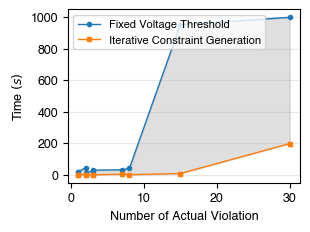

In [35]:
### Visualization

Vio_num_arr = np.array(Vio_num_list)
Time_fix = np.array(Time_list)
Time_gen = np.array(Time_list2)

diff = Time_fix - Time_gen

order = np.argsort(Vio_num_list)


fig, ax1 = plt.subplots(figsize=(3, 2.25))

line1, = ax1.plot(
    Vio_num_arr[order], Time_fix[order],
    color="C0",
    linestyle="-",
    linewidth=1,
    marker="o",
    ms = 3,
    label="Fixed Voltage Threshold"
)

line2, = ax1.plot(
    Vio_num_arr[order], Time_gen[order],
    color="C1",
    linestyle="-",
    linewidth=1,
    marker="s",
    ms = 3,
    label="Iterative Constraint Generation"
)

ax1.fill_between(
    Vio_num_arr[order],
    Time_fix[order],
    Time_gen[order],
    alpha=0.25,
    color="grey",
    label="Time Difference"
)


ax1.set_xlabel("Number of Actual Violation")
ax1.set_ylabel("Time $(s)$")
ax1.grid(True, axis="y", alpha=0.3)


# Legend: only two entries
ax1.legend(
    handles=[line1, line2],
    loc="upper left",
    fontsize=8
)

#plt.savefig('fig_part1.pdf', dpi=300, bbox_inches='tight')
plt.show()

## Comparison to Other Framework of Measurement Selection

### Performance compared in Figure 3a

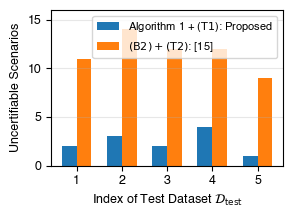

In [54]:
xx = np.arange(1, 6)

bar_width = 0.33

fig, ax = plt.subplots(figsize=(3, 2.25))

ax.bar(
    xx - bar_width / 2,
    num_scenario_proposed,
    width=bar_width,
    color="C0",
    label=r"Algorithm 1 + ($\mathsf{T1}$): Proposed"
)

ax.bar(
    xx + bar_width / 2,
    num_scenario_box,
    width=bar_width,
    color="C1",
    label=r"$(\mathsf{B 2})+(\mathsf{T2})$: [15]"
)


ax.set_xlabel(r"Index of Test Dataset $\mathcal{D}_{\mathrm{test}}$")
ax.set_ylabel("Uncertifiable Scenarios")
ax.set_xticks(xx)
ax.set_ylim([0, 16])
ax.legend(fontsize=8)
ax.grid(True, axis="y", alpha=0.3)

plt.tight_layout()
#plt.savefig('fig_part2-1_new.pdf', dpi=300, bbox_inches='tight')
plt.show()


### Performance compared in Figure 3b

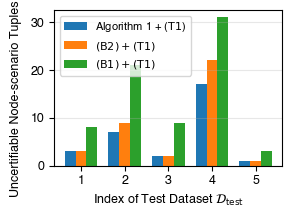

In [55]:
xx = np.arange(1, 6)

bar_width = 0.25

fig, ax = plt.subplots(figsize=(3, 2.25))

ax.bar(
    xx - bar_width,
    num_nodescenario_proposed,
    width=bar_width,
    color="C0",
    label=r"Algorithm 1 + ($\mathsf{T 1}$)"
)

ax.bar(
    xx,
    num_nodescenario_box,
    width=bar_width,
    color="C1",
    label=r"$(\mathsf{B2})+(\mathsf{T1})$"
)

ax.bar(
    xx + bar_width,
    num_nodescenario_control,
    width=bar_width,
    color="C2",
    label=r"$(\mathsf{B1})+(\mathsf{T1})$"
)

ax.set_xlabel(r"Index of Test Dataset $\mathcal{D}_{\mathrm{test}}$")
ax.set_ylabel("Uncertifiable Node-scenario Tuples")
# x_pos, y_pos = ax.yaxis.get_label().get_position()

ax.yaxis.set_label_coords(-0.14, 0.43)
ax.set_xticks(xx)
ax.legend(fontsize=8)
ax.grid(True, axis="y", alpha=0.3)

plt.tight_layout()
#plt.savefig('fig_part2-2_new.pdf', dpi=300, bbox_inches='tight')
plt.show()
